In [190]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import os


In [191]:
# Import training data & testing data
cwd = os.getcwd()
train_data_import = pd.read_csv(cwd + "./banking_train.csv", sep=";")
test_data_import = pd.read_csv(cwd + "./banking_test.csv", sep=";")

# Create copies of the original data to manipulate
train_data = train_data_import.copy()
test_data = test_data_import.copy()

## Project Ideas:
* Explore the demographics within the dataset and compare to default status
* Find the variable(s) that best predict the default status 

In [192]:
train_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Exploratory Data Analysis
* Explore missing values
* Descriptive Statistics
* Remove predictor variables with weak predictive power
* Examine the Dataframe
* Visualize & Eliminate Outliers
* Visualize the Distribution of Independent Variables vs Dependent Variables

In [193]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [194]:
# Descriptive statistics for the training data
train_data.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


## Rename Target Variable & Preview Dataframe

In [195]:
train_data = train_data.rename(columns={'y':'term_deposit'})
train_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,term_deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Numeric Variable Analysis

### Age
* Young_Adult: < 25
* Adult: 26 - 55
* Senior_Adult: > 55

In [196]:
train_data['age'].describe(percentiles=[.01, .05,.1,.25,.5,.75,.9,.95,.99])

count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
1%          23.000000
5%          27.000000
10%         29.000000
25%         33.000000
50%         39.000000
75%         48.000000
90%         56.000000
95%         59.000000
99%         71.000000
max         95.000000
Name: age, dtype: float64

In [197]:
def age_conv(age):
    if age <= 25:
        return 'Young_Adult'
    elif age <= 55:
        return 'Adult'
    else:
        return 'Senior_Adult'

train_data['age_cat'] = train_data['age'].apply(age_conv)

print('Age Category Frequency Counts')
display(train_data['age_cat'].value_counts())
print('Age Category vs Default')
display(pd.crosstab(train_data['age_cat'], train_data['default'], normalize='index'))
print('Age Category vs Term Deposit')
display(pd.crosstab(train_data['age_cat'], train_data['term_deposit'], normalize='index'))

Age Category Frequency Counts


Adult           38975
Senior_Adult     4900
Young_Adult      1336
Name: age_cat, dtype: int64

Age Category vs Default


default,no,yes
age_cat,,
Adult,0.980911,0.019089
Senior_Adult,0.989388,0.010612
Young_Adult,0.985778,0.014222


Age Category vs Term Deposit


term_deposit,no,yes
age_cat,,
Adult,0.895754,0.104246
Senior_Adult,0.815102,0.184898
Young_Adult,0.760479,0.239521


### Balance: balance_cat
* Negative: < 0
* Positive: >= 0

In [198]:
train_data['balance'].describe(percentiles=[.01, .05,.1,.25,.5,.75,.9,.95,.99])

count     45211.000000
mean       1362.272058
std        3044.765829
min       -8019.000000
1%         -627.000000
5%         -172.000000
10%           0.000000
25%          72.000000
50%         448.000000
75%        1428.000000
90%        3574.000000
95%        5768.000000
99%       13164.900000
max      102127.000000
Name: balance, dtype: float64

In [199]:
train_data['balance_cat'] = train_data['balance'].apply(lambda x: 'Negative' if x < 0 else 'Positive')

display(train_data['balance_cat'].value_counts())

display(pd.crosstab(train_data['balance_cat'], train_data['default'], normalize='index'))
display(pd.crosstab(train_data['balance_cat'], train_data['term_deposit'], normalize='index'))

Positive    41445
Negative     3766
Name: balance_cat, dtype: int64

default,no,yes
balance_cat,,
Negative,0.883165,0.116835
Positive,0.990952,0.009048


term_deposit,no,yes
balance_cat,,
Negative,0.944238,0.055762
Positive,0.877452,0.122548


## Categorical Variable Analysis

In [200]:
train_data.select_dtypes(include='object')

,job,marital,education,default,housing,loan,contact,month,poutcome,term_deposit,age_cat,balance_cat
0,management,married,tertiary,no,yes,no,unknown,may,unknown,no,Senior_Adult,Positive
1,technician,single,secondary,no,yes,no,unknown,may,unknown,no,Adult,Positive
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no,Adult,Positive
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no,Adult,Positive
4,unknown,single,unknown,no,no,no,unknown,may,unknown,no,Adult,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,yes,Adult,Positive
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,yes,Senior_Adult,Positive
45208,retired,married,secondary,no,no,no,cellular,nov,success,yes,Senior_Adult,Positive
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,no,Senior_Adult,Positive


#### Job: job_cat
* blue-collar = (blue-collar, technician, services, housemaid)
* admin = (admin, management)
* unemployed/retired = (unemployed, retired, unknown)
* self-employed = (self-employed, entrepreneur) 
* student = (student)

In [201]:
def job_conv(job):
    b_collar = ['blue-collar', 'technician', 'services', 'housemaid']
    admin = ['admin.', 'management']
    unemploy = ['unemployed', 'retired', 'unknown']
    self_empl = ['self-employed', 'entrepreneur']
    student = ['student']

    if job in b_collar:
        return 'Blue_Collar'
    elif job in admin:
        return 'Administration'
    elif job in unemploy:
        return 'Unemployed/Retired'
    elif job in self_empl:
        return 'Self-Employed'
    elif job in student:
        return 'Student'
    else:
        'Invalid Category'


train_data['job_cat'] = train_data['job'].apply(job_conv)

display(train_data['job_cat'].value_counts())

display(pd.crosstab(train_data['job_cat'], train_data['default'], normalize='index'))

display(pd.crosstab(train_data['job_cat'], train_data['term_deposit'], normalize='index'))

Blue_Collar           22723
Administration        14629
Unemployed/Retired     3855
Self-Employed          3066
Student                 938
Name: job_cat, dtype: int64

default,no,yes
job_cat,,
Administration,0.983731,0.016269
Blue_Collar,0.981164,0.018836
Self-Employed,0.971298,0.028702
Student,0.996802,0.003198
Unemployed/Retired,0.984955,0.015045


term_deposit,no,yes
job_cat,,
Administration,0.867934,0.132066
Blue_Collar,0.910839,0.089161
Self-Employed,0.898891,0.101109
Student,0.713220,0.286780
Unemployed/Retired,0.804929,0.195071


### Credit Default Analysis: Crosstabs

In [202]:
train_data['default'].value_counts()

no     44396
yes      815
Name: default, dtype: int64

In [203]:
cat_vars = ['job', 'marital', 'education', 'housing', 'loan', 'balance_cat', 'age_cat', 'job_cat']

for var in cat_vars:
    print(f'{var.upper()} vs Default Crosstab')
    display(pd.crosstab(train_data[var], train_data['default'], normalize='index'))

JOB vs Default Crosstab


default,no,yes
job,,
admin.,0.985689,0.014311
blue-collar,0.979346,0.020654
entrepreneur,0.963013,0.036987
housemaid,0.982258,0.017742
management,0.982660,0.017340
retired,0.988516,0.011484
self-employed,0.979101,0.020899
services,0.981945,0.018055
student,0.996802,0.003198


MARITAL vs Default Crosstab


default,no,yes
marital,,
divorced,0.975418,0.024582
married,0.983538,0.016462
single,0.981314,0.018686


EDUCATION vs Default Crosstab


default,no,yes
education,,
primary,0.981463,0.018537
secondary,0.980260,0.019740
tertiary,0.985114,0.014886
unknown,0.982768,0.017232


HOUSING vs Default Crosstab


default,no,yes
housing,,
no,0.981077,0.018923
yes,0.982690,0.017310


LOAN vs Default Crosstab


default,no,yes
loan,,
no,0.986462,0.013538
yes,0.958448,0.041552


BALANCE_CAT vs Default Crosstab


default,no,yes
balance_cat,,
Negative,0.883165,0.116835
Positive,0.990952,0.009048


AGE_CAT vs Default Crosstab


default,no,yes
age_cat,,
Adult,0.980911,0.019089
Senior_Adult,0.989388,0.010612
Young_Adult,0.985778,0.014222


JOB_CAT vs Default Crosstab


default,no,yes
job_cat,,
Administration,0.983731,0.016269
Blue_Collar,0.981164,0.018836
Self-Employed,0.971298,0.028702
Student,0.996802,0.003198
Unemployed/Retired,0.984955,0.015045


In [204]:
for var in cat_vars:
    print(f'{var.upper()} vs Default Crosstab')
    display(pd.crosstab(train_data[var], train_data['default'], normalize='index'))

JOB vs Default Crosstab


default,no,yes
job,,
admin.,0.985689,0.014311
blue-collar,0.979346,0.020654
entrepreneur,0.963013,0.036987
housemaid,0.982258,0.017742
management,0.982660,0.017340
retired,0.988516,0.011484
self-employed,0.979101,0.020899
services,0.981945,0.018055
student,0.996802,0.003198


MARITAL vs Default Crosstab


default,no,yes
marital,,
divorced,0.975418,0.024582
married,0.983538,0.016462
single,0.981314,0.018686


EDUCATION vs Default Crosstab


default,no,yes
education,,
primary,0.981463,0.018537
secondary,0.980260,0.019740
tertiary,0.985114,0.014886
unknown,0.982768,0.017232


HOUSING vs Default Crosstab


default,no,yes
housing,,
no,0.981077,0.018923
yes,0.982690,0.017310


LOAN vs Default Crosstab


default,no,yes
loan,,
no,0.986462,0.013538
yes,0.958448,0.041552


BALANCE_CAT vs Default Crosstab


default,no,yes
balance_cat,,
Negative,0.883165,0.116835
Positive,0.990952,0.009048


AGE_CAT vs Default Crosstab


default,no,yes
age_cat,,
Adult,0.980911,0.019089
Senior_Adult,0.989388,0.010612
Young_Adult,0.985778,0.014222


JOB_CAT vs Default Crosstab


default,no,yes
job_cat,,
Administration,0.983731,0.016269
Blue_Collar,0.981164,0.018836
Self-Employed,0.971298,0.028702
Student,0.996802,0.003198
Unemployed/Retired,0.984955,0.015045


## Default Analysis: Logistic Regression

#### Marital Status vs Default

In [205]:
from statsmodels.formula.api import logit


train_data['default'] = train_data['default'].apply(lambda x: 1 if x == 'yes' else 0)

model1d = logit(formula='default ~ marital', data=train_data).fit()

model1d.summary()

Optimization terminated successfully.
         Current function value: 0.090084
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45208
Method:                           MLE   Df Model:                            2
Date:                Fri, 12 May 2023   Pseudo R-squ.:                0.001905
Time:                        02:14:15   Log-Likelihood:                -4072.8
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                 0.0004204
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -3.6808      0.089    -41.129      0.000      -3.856      -3.505
marital[T.married]    -0.4093      0.101     -4.037      0.000      -0.608      -0.211
marital[T.single]     -0.2803      0.111     -2.530      0.011      -0.497      -0.063
======================================================================================
"""

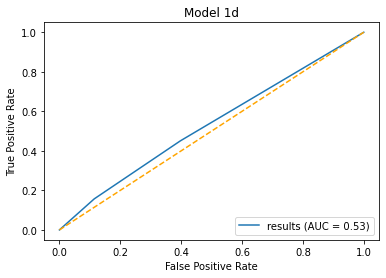

In [206]:
import matplotlib.pyplot as plt

# Import Metrics package
import sklearn.metrics as skm

# Make predictions for Model #1
train_data['pred_1d'] = model1d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_1d'])


# ROC Curve Plot Function
def plot_roc(fpr,tpr, title):
    
    # AUC score
    auc_score = skm.auc(fpr,tpr)
    
    # ROC curve
    skm.RocCurveDisplay(fpr=fpr, tpr=tpr,
                        roc_auc=auc_score,
                        estimator_name='results').plot()
    
    # Add title to ROC curve
    plt.title(title)
    
    # Add the diagonal line
    plt.plot([0, 1], [0, 1], 
             color='orange', 
             linestyle='--')

# Display ROC Curve w/ AUC Score: Model1d
plot_roc(fpr,tpr, title='Model 1d')

#### 

#### Job Category vs Default

In [212]:
model2d = logit(formula='default ~ job_cat', data=train_data).fit()

model2d.summary()

Optimization terminated successfully.
         Current function value: 0.089815
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45206
Method:                           MLE   Df Model:                            4
Date:                Fri, 12 May 2023   Pseudo R-squ.:                0.004892
Time:                        02:14:26   Log-Likelihood:                -4060.6
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                 4.488e-08
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                        -4.1021      0.065    -62.767      0.000      -4.230      -3.974
job_cat[T.Blue_Collar]            0.1491      0.082      1.828      0.068      -0.011       0.309
job_cat[T.Self-Employed]          0.5804      0.126      4.593      0.000       0.333       0.828
job_cat[T.Student]               -1.6398      0.582     -2.818      0.005      -2.780      -0.499
job_cat[T.Unemployed/Retired]    -0.0794      0.148     -0.538      0.590      -0.369       0.210
=================================================================================================
"""

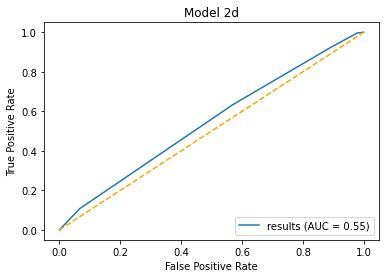

In [213]:
# Make predictions for Model #2d
train_data['pred_2d'] = model2d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_2d'])

# Display ROC Curve w/ AUC Score: Model1d
plot_roc(fpr,tpr, title='Model 2d')

#### Age Category vs Default

In [214]:
model3d = logit(formula='default ~ age_cat', data=train_data).fit()

model3d.summary()

Optimization terminated successfully.
         Current function value: 0.090019
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45208
Method:                           MLE   Df Model:                            2
Date:                Fri, 12 May 2023   Pseudo R-squ.:                0.002628
Time:                        02:15:47   Log-Likelihood:                -4069.9
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                 2.201e-05
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -3.9394      0.037   -106.421      0.000      -4.012      -3.867
age_cat[T.Senior_Adult]    -0.5957      0.144     -4.130      0.000      -0.878      -0.313
age_cat[T.Young_Adult]     -0.2993      0.234     -1.279      0.201      -0.758       0.159
===========================================================================================
"""

#### Balance Category vs Default

In [225]:
model4d = logit(formula='default ~ balance_cat', data=train_data).fit()

model4d.summary()

Optimization terminated successfully.
         Current function value: 0.077319
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45209
Method:                           MLE   Df Model:                            1
Date:                Fri, 12 May 2023   Pseudo R-squ.:                  0.1433
Time:                        02:22:46   Log-Likelihood:                -3495.7
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                2.193e-256
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -2.0228      0.051    -39.874      0.000      -2.122      -1.923
balance_cat[T.Positive]    -2.6734      0.073    -36.845      0.000      -2.816      -2.531
===========================================================================================
"""

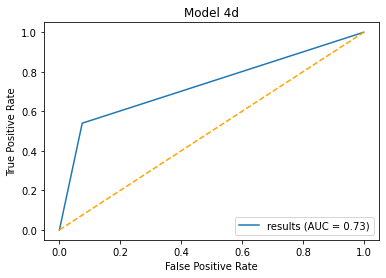

In [226]:
# Make predictions for Model #2d
train_data['pred_4d'] = model4d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_4d'])

# Display ROC Curve w/ AUC Score: Model1d
plot_roc(fpr,tpr, title='Model 4d')

#### Active Loan vs Default

In [228]:
model5d = logit(formula='default ~ loan', data=train_data).fit()

model5d.summary()

Optimization terminated successfully.
         Current function value: 0.087898
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45209
Method:                           MLE   Df Model:                            1
Date:                Fri, 12 May 2023   Pseudo R-squ.:                 0.02613
Time:                        02:24:26   Log-Likelihood:                -3973.9
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                 2.674e-48
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -4.2886      0.044    -96.569      0.000      -4.376      -4.202
loan[T.yes]     1.1502      0.074     15.597      0.000       1.006       1.295
===============================================================================
"""

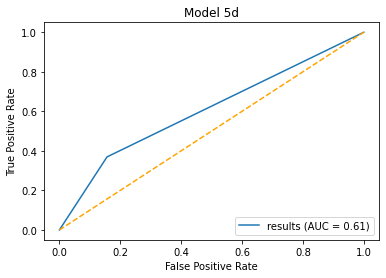

In [229]:
# Make predictions for Model #2d
train_data['pred_5d'] = model5d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_5d'])

# Display ROC Curve w/ AUC Score: Model1d
plot_roc(fpr,tpr, title='Model 5d')

#### Education vs Default

In [236]:
modelxd = logit(formula='default ~ term_deposit + balance_cat + loan', data=train_data).fit()

modelxd.summary()

Optimization terminated successfully.
         Current function value: 0.076413
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45207
Method:                           MLE   Df Model:                            3
Date:                Fri, 12 May 2023   Pseudo R-squ.:                  0.1534
Time:                        02:27:37   Log-Likelihood:                -3454.7
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                4.463e-271
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -2.2735      0.062    -36.625      0.000      -2.395      -2.152
term_deposit[T.yes]        -0.3154      0.147     -2.143      0.032      -0.604      -0.027
balance_cat[T.Positive]    -2.5273      0.074    -33.933      0.000      -2.673      -2.381
loan[T.yes]                 0.6990      0.078      8.982      0.000       0.546       0.852
===========================================================================================
"""

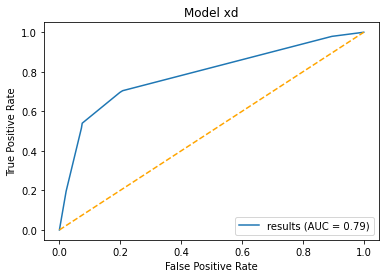

In [237]:
# Make predictions for Model #2d
train_data['pred_xd'] = modelxd.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_xd'])

# Display ROC Curve w/ AUC Score: Model xd
plot_roc(fpr,tpr, title='Model xd')

In [243]:
modelx2d = logit(formula='default ~ term_deposit + balance_cat + loan + housing', data=train_data).fit()

modelx2d.summary()

Optimization terminated successfully.
         Current function value: 0.075978
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45206
Method:                           MLE   Df Model:                            4
Date:                Fri, 12 May 2023   Pseudo R-squ.:                  0.1582
Time:                        02:30:49   Log-Likelihood:                -3435.0
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                2.820e-278
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -1.9398      0.080    -24.186      0.000      -2.097      -1.783
term_deposit[T.yes]        -0.3790      0.148     -2.568      0.010      -0.668      -0.090
balance_cat[T.Positive]    -2.6133      0.076    -34.168      0.000      -2.763      -2.463
loan[T.yes]                 0.6689      0.079      8.517      0.000       0.515       0.823
housing[T.yes]             -0.4725      0.075     -6.308      0.000      -0.619      -0.326
===========================================================================================
"""

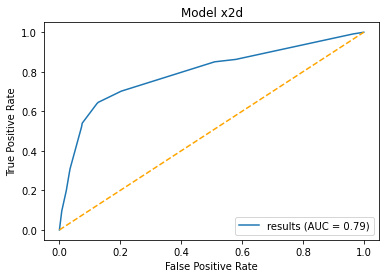

In [245]:
# Make predictions for Model x2d
train_data['pred_x2d'] = modelx2d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_x2d'])

# Display ROC Curve w/ AUC Score: Model x2d
plot_roc(fpr,tpr, title='Model x2d')

In [266]:
modelx3d = logit(formula='default ~ balance_cat + loan + housing', data=train_data).fit()

modelx3d.summary()

Optimization terminated successfully.
         Current function value: 0.076058
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45207
Method:                           MLE   Df Model:                            3
Date:                Fri, 12 May 2023   Pseudo R-squ.:                  0.1573
Time:                        02:39:37   Log-Likelihood:                -3438.7
converged:                       True   LL-Null:                       -4080.6
Covariance Type:            nonrobust   LLR p-value:                4.726e-278
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -1.9719      0.080    -24.757      0.000      -2.128      -1.816
balance_cat[T.Positive]    -2.6304      0.076    -34.410      0.000      -2.780      -2.481
loan[T.yes]                 0.6776      0.079      8.624      0.000       0.524       0.832
housing[T.yes]             -0.4577      0.075     -6.120      0.000      -0.604      -0.311
===========================================================================================
"""

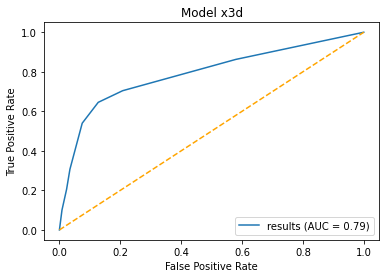

In [267]:
# Make predictions for Model x2d
train_data['pred_x3d'] = modelx3d.predict(train_data)

# Generate fpr, tpr, and thresholds for ROC curve
fpr, tpr, thresholds = skm.roc_curve(train_data['default'], train_data['pred_x3d'])

# Display ROC Curve w/ AUC Score: Model x3d
plot_roc(fpr,tpr, title='Model x3d')

In [230]:
train_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,...,previous,poutcome,term_deposit,age_cat,balance_cat,job_cat,pred_1d,pred_2d,pred_4d,pred_5d
0,58,management,married,tertiary,0,2143,yes,no,unknown,5,...,0,unknown,no,Senior_Adult,Positive,Administration,0.016462,0.016269,0.009048,0.013538
1,44,technician,single,secondary,0,29,yes,no,unknown,5,...,0,unknown,no,Adult,Positive,Blue_Collar,0.018686,0.018836,0.009048,0.013538
2,33,entrepreneur,married,secondary,0,2,yes,yes,unknown,5,...,0,unknown,no,Adult,Positive,Self-Employed,0.016462,0.028702,0.009048,0.041552
3,47,blue-collar,married,unknown,0,1506,yes,no,unknown,5,...,0,unknown,no,Adult,Positive,Blue_Collar,0.016462,0.018836,0.009048,0.013538
4,33,unknown,single,unknown,0,1,no,no,unknown,5,...,0,unknown,no,Adult,Positive,Unemployed/Retired,0.018686,0.015045,0.009048,0.013538


In [247]:
train_data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'term_deposit', 'age_cat', 'balance_cat',
       'job_cat', 'pred_1d', 'pred_2d', 'pred_4d', 'pred_5d', 'pred_xd',
       'pred_x2d'],
      dtype='object')

In [211]:
train_data['y'] = train_data['y'].apply(lambda x: 1 if x == 'yes' else 0)

KeyError: 'y'

## Explore and Eliminate Outliers in the Data
* Age
* Balance

In [ ]:
# Create the upper and lower limits to determine outliers : Age
iqr_age = train_data["age"].quantile(.75) - train_data["age"].quantile(.25)
lower_limit_age = train_data["age"].quantile(.25) - (iqr_age * 1.5)
upper_limit_age = train_data["age"].quantile(.75) + (iqr_age * 1.5)
print(f"Lower Limit for Age Outliers: {lower_limit_age}") 
print(f"Upper Limit for Age Outliers: {upper_limit_age}") 


# Create a Boxplot for age
fig = px.box(train_data, x="age")
fig.show()

# Create Histogram for age
fig = px.histogram(train_data, x="age")
fig.show()

# Create the upper and lower limits to determine outliers : Balance
iqr_balance = train_data["balance"].quantile(.75) - train_data["balance"].quantile(.25)
lower_limit_balance = train_data["balance"].quantile(.25) - (iqr_balance * 1.5)
upper_limit_balance = train_data["balance"].quantile(.75) + (iqr_balance * 1.5)
print(f"Lower Limit for Balance Outliers: {lower_limit_balance}") 
print(f"Upper Limit for Balance Outliers: {upper_limit_balance}") 

# Create a Boxplot for Balance
fig = px.box(train_data, x="balance")
fig.show()

# Create Histogram for Balance
fig = px.histogram(train_data, x="balance")
fig.show()



Lower Limit for Age Outliers: 10.5
Upper Limit for Age Outliers: 70.5


Lower Limit for Balance Outliers: -1962.0
Upper Limit for Balance Outliers: 3462.0


### 1. Elminate Outliers in <b>Age</b> Variable

In [ ]:
# Subset & Count records that have age values above the upper limit
age_outlier_upper = train_data.loc[train_data["age"] > 70,:]
age_outlier_upper_count = age_outlier_upper.shape[0]

# Subset & Count records that have age values below the lower limit
age_outlier_lower = train_data.loc[train_data["age"] <= 10,:]
age_outlier_lower_count = age_outlier_lower.shape[0]

# Print the Count of records with Outliers in the age variable
print(f"{age_outlier_upper_count} records with age outliers above the Upper Limit")
print(f"{age_outlier_lower_count} records with age outliers below the Lower Limit")


487 records with age outliers above the Upper Limit
0 records with age outliers below the Lower Limit


In [ ]:
# Drop the records with age values above upper limit from original dataframe
clean_data_temp = train_data.drop(age_outlier_upper.index, axis=0)

# Compare size of original dataframe against modified(dropped age outliers) dataset
original_data_size = train_data.shape[0]
clean_data_temp_size = clean_data_temp.shape[0]

# Print size differences in dataframes
print(f"Number of records WITH Age Outliers: {original_data_size}") 
print(f"Number of records WITHOUT Age Outliers: {clean_data_temp_size}") 

# Create a Boxplot for age
fig = px.box(clean_data_temp, x="age")
fig.show()

# Create Histogram for age
fig = px.histogram(clean_data_temp, x="age")
fig.show()


Number of records WITH Age Outliers: 45211
Number of records WITHOUT Age Outliers: 44724


### 2. Eliminate Outliers in <b>Balance</b> Variable

In [ ]:
# Subset & Count records that have balance values above the upper limit
bal_outlier_upper = clean_data_temp.loc[clean_data_temp["balance"] > 1500,:]
bal_outlier_upper_count = bal_outlier_upper.shape[0]

# Subset & Count records that have balance values below the lower limit
bal_outlier_lower = clean_data_temp.loc[clean_data_temp["balance"] < -750,:]
bal_outlier_lower_count = bal_outlier_lower.shape[0]

# Print the Count of records with Outliers in the age variable
print(f"{bal_outlier_upper_count} records with balance outliers above the Upper Limit")
print(f"{bal_outlier_lower_count} records with balance outliers below the Lower Limit")

10665 records with balance outliers above the Upper Limit
314 records with balance outliers below the Lower Limit


In [ ]:
# Drop the records with balance values above upper limit from original dataframe
clean_data = clean_data_temp.drop(bal_outlier_upper.index, axis=0)
clean_data = clean_data.drop(bal_outlier_lower.index, axis=0)

# Compare size of current dataframe against modified(dropped age outliers) dataset
temp_data_size = clean_data_temp.shape[0]
clean_data_size = clean_data.shape[0]

# Print size differences in dataframes
print(f"Number of records WITH Age Outliers: {temp_data_size}") 
print(f"Number of records WITHOUT Age Outliers: {clean_data_size}") 

# Create a Boxplot for Balance
fig = px.box(clean_data, x="balance")
fig.show()

# Create Histogram for Balance
fig = px.histogram(clean_data, x="balance")
fig.show()


Number of records WITH Age Outliers: 44724
Number of records WITHOUT Age Outliers: 33745


In [ ]:
# Explore the distribution of our target variable


fig = px.histogram(train_data, x='y')
fig.show()

## Percentage of Data per Class
### <u>Imbalanced</u> target values will have to be balanced before creating a model
* We will handle this later...

In [ ]:
default_count = train_data[train_data["y"] == "yes"].shape[0]
not_default_count = train_data[train_data["y"] == "no"].shape[0]

print("****Negative Class****")
print(round(default_count / train_data.shape[0], 2) * 100)
print("****Positive Class****")
print(round(not_default_count / train_data.shape[0], 2) * 100)

****Negative Class****
0.0
****Positive Class****
0.0


## Examine the <b>Distributions</b> of the Numeric Variables

In [ ]:
# Visualize the distribution of Default Status by Age

fig = px.histogram(train_data, x="age", color="y", title="Default Status Count by Age")
fig.show()

In [ ]:
# Visualize the distribution of Default Status by Job
job_counts = train_data["job"].value_counts(ascending=False)
job_counts

fig = px.histogram(train_data, x="job", color="y", title="Default Status Count by Job")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="marital", color="y", title="Marital Status Count by Default Status")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="education", color="y")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="housing", color="y")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="loan", color="y")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="contact", color="y")
fig.show()

In [ ]:
fig = px.histogram(train_data, "poutcome", color="y")
fig.show()

In [ ]:
fig = px.scatter(train_data, x="age", y="balance", color="y")
fig.show()

In [ ]:
fig = px.scatter(train_data, x="age", y="y")
fig.show()

In [ ]:
fig = px.scatter(train_data, x="balance", y="y")
fig.show()

## Eliminate Variables with Useless Information & Weak Predictive Power

In [ ]:
train_data = clean_data.copy()
train_data["poutcome"].value_counts(ascending=False)

unknown    27951
failure     3530
other       1344
success      920
Name: poutcome, dtype: int64

## Feature Engineering

In [ ]:
# Create a column to indicate customers with negative balances

def negative_ind(series):
    if series < 0:
        return 1
    else:
        return 0

train_data["neg_balance"] = train_data["balance"].apply(negative_ind)


# Create a column to seperate balance values into bins

def balance_bins(series):
    if series > 60000:
        return "> 60K"
    elif series > 30000:
        return "30-60K"
    elif series > 10000:
        return "10-30K"
    else:
        return "< 10k"

train_data["balance_cat"] = train_data["balance"].apply(balance_bins)

In [ ]:
fig = px.histogram(train_data, x="balance_cat", color="y")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="neg_balance", color="y")
fig.show()

## Examine Outliers in the Data

In [ ]:
cat_data = train_data.select_dtypes(exclude="int")
cat_data = cat_data.drop("y", axis=1)
cat_data

KeyError: "['y'] not found in axis"

In [ ]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

cat_cols = ["job", "marital", "education", "contact", "month", "balance_cat"]
binary_cols = ["default", "housing", "loan"]

def binary_convert(series):
    if series == "yes":
        return 1
    else:
        return 0

for col in binary_cols:
    cat_data[col + "_ind"] = cat_data[col].apply(binary_convert)

for col in cat_cols:
    one_hot = LabelEncoder()
    cat_data[col + "_ind"] = one_hot.fit_transform(cat_data[col])


In [ ]:
cat_data

,job,marital,education,default,housing,loan,contact,month,poutcome,balance_cat,default_ind,housing_ind,loan_ind,job_ind,marital_ind,education_ind,contact_ind,month_ind,balance_cat_ind
0,management,married,tertiary,no,yes,no,unknown,may,unknown,< 10k,0,1,0,4,1,2,2,8,2
1,technician,single,secondary,no,yes,no,unknown,may,unknown,< 10k,0,1,0,9,2,1,2,8,2
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,< 10k,0,1,1,2,1,1,2,8,2
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,< 10k,0,1,0,1,1,3,2,8,2
4,unknown,single,unknown,no,no,no,unknown,may,unknown,< 10k,0,0,0,11,2,3,2,8,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,< 10k,0,0,0,9,1,2,0,9,2
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,< 10k,0,0,0,5,0,0,0,9,2
45208,retired,married,secondary,no,no,no,cellular,nov,success,< 10k,0,0,0,5,1,1,0,9,2
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,< 10k,0,0,0,1,1,1,1,9,2


In [ ]:
processed_data = cat_data.iloc[:,10:]
processed_data.head()

,default_ind,housing_ind,loan_ind,job_ind,marital_ind,education_ind,contact_ind,month_ind,balance_cat_ind
0,0,1,0,4,1,2,2,8,2
1,0,1,0,9,2,1,2,8,2
2,0,1,1,2,1,1,2,8,2
3,0,1,0,1,1,3,2,8,2
4,0,0,0,11,2,3,2,8,2


In [ ]:
# Convert target variable to a binary series
y_conv = train_data["y"].apply(binary_convert)
y_conv.value_counts()


0    39922
1     5289
Name: y, dtype: int64

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, accuracy_score, classification_report, r2_score, ConfusionMatrixDisplay, confusion_matrix, RocCurveDisplay
from sklearn.preprocessing import StandardScaler 
from imblearn.over_sampling import SMOTE

In [ ]:
X = processed_data
y = y_conv

os = SMOTE(random_state=42)

X_os, y_os = os.fit_resample(X, y)
print(f" X shape: {X_os.shape}")
print(f" y shape: {y_os.shape}")




 X shape: (79844, 9)
 y shape: (79844,)


In [ ]:


X_train, X_test, y_train, y_test = train_test_split(X_os, y_os, test_size=.3, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LogisticRegression(random_state=42)
rf = RandomForestClassifier(random_state=42)

lr_cval = cross_val_score(lr, X_train_scaled, y_train, cv=10)
rf_cval = cross_val_score(rf, X_train_scaled, y_train, cv=10)

print(f"Logistic Regression Cross Validation {lr_cval.mean()}")
print(f"Random Forest Cross Validation {rf_cval.mean()}")



Logistic Regression Cross Validation 0.6629092860976918
Random Forest Cross Validation 0.7427088924673465


## Random Forest Classifier
* After Cross validation, we see that <b>Random Forest</b> model performs better than the <b>Logistic Regression</b>
* Now lets <b>make predictions</b>, <b>calculate metrics</b>, and <b>fine tune the hyperparameters</b> 

1    12218
0    11736
dtype: int64
              precision    recall  f1-score   support

           0       0.74      0.73      0.73     11973
           1       0.73      0.75      0.74     11981

    accuracy                           0.74     23954
   macro avg       0.74      0.74      0.74     23954
weighted avg       0.74      0.74      0.74     23954

ROC AUC Score: 0.8197753921645741
Accuracy Score: 0.7356182683476664


<Figure size 1080x1080 with 0 Axes>

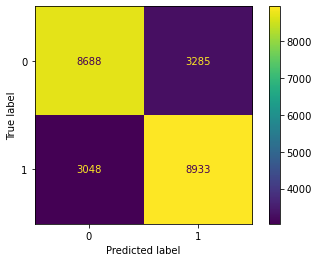

In [ ]:
rf.fit(X_train_scaled, y_train)
y_pred = rf.predict(X_test_scaled)
y_prob = rf.predict_proba(X_test_scaled)
y_prob = y_prob[:,1]

# Make sure the predictions are distributed properly
print(pd.Series(y_pred).value_counts())

rf_report = classification_report(y_test, y_pred)
rf_roc = roc_auc_score(y_test, y_prob)
rf_acc = accuracy_score(y_test, y_pred)

print(rf_report)
print(f"ROC AUC Score: {rf_roc}")
print(f"Accuracy Score: {rf_acc}")


conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

fig = plt.figure(figsize=(15,15))
disp.plot()
plt.show()



[]

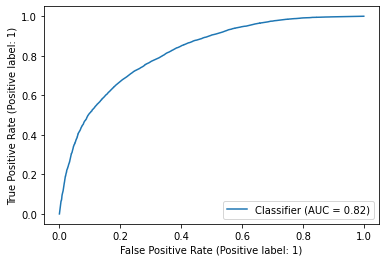

In [ ]:
RocCurveDisplay.from_predictions(y_test, y_prob)
plt.plot()

## Tune Hyperparameters for the Random Forest Model

In [ ]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Parameter values for grid search
param_grid = {
              "n_estimators": [100, 200, 500],
              "criterion": ("gini", "entropy", "log_loss"),
              "max_depth": [5, 10, 15, 50],
              "max_features": ["sqrt", "log2"]
}


# Create a new model for Parameter Tuning
rf_model = RandomForestClassifier(random_state=42)

# Create Grid Search CV object with classifier and parameter grid
clf = GridSearchCV(rf_model, param_grid, n_jobs=-1, cv=10)

# Fit Grid Search CV object
clf.fit(X_train_scaled, y_train)

clf.get_params




KeyboardInterrupt: 

In [ ]:

clf.best_params_







{'criterion': 'gini',
 'max_depth': 50,
 'max_features': 'sqrt',
 'n_estimators': 500}

In [ ]:
clf.best_estimator_

RandomForestClassifier(max_depth=50, n_estimators=500, random_state=42)

              precision    recall  f1-score   support

           0       0.74      0.73      0.73     11973
           1       0.73      0.74      0.74     11981

    accuracy                           0.74     23954
   macro avg       0.74      0.74      0.74     23954
weighted avg       0.74      0.74      0.74     23954

ROC AUC Score: 0.8194999100478649
Accuracy Score: 0.7363697086081656


<Figure size 1080x1080 with 0 Axes>

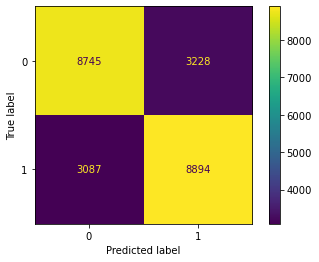

In [ ]:
final_model = RandomForestClassifier(max_depth=50, n_estimators=50, random_state=42)
final_model.fit(X_train_scaled, y_train)

final_pred = final_model.predict(X_test_scaled)
final_prob = final_model.predict_proba(X_test_scaled)
final_prob = final_prob[:,1]


# Create Classification Scores Report & ROC AUC Score
final_report = classification_report(y_test, final_pred)
final_roc = roc_auc_score(y_test, final_prob)
final_acc = accuracy_score(y_test, final_pred)

print(final_report)
print(f"ROC AUC Score: {final_roc}")
print(f"Accuracy Score: {final_acc}")

# Visualize the Confusion Matrix
conf_matrix = confusion_matrix(y_test, final_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

fig = plt.figure(figsize=(15,15))
disp.plot()
plt.show()



[]

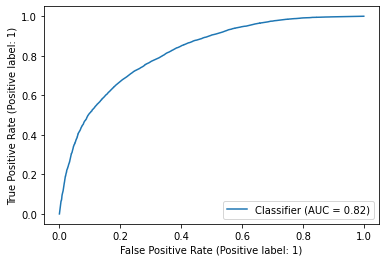

In [ ]:
# Visualize the ROC AUC Curve
RocCurveDisplay.from_predictions(y_test, y_prob)
plt.plot()